<a href="https://colab.research.google.com/github/changsin/DL/blob/main/notebooks/openpose_sign_language.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sign Language Recognition with OpenPose

This notebook uses an open source project [CMU-Perceptual-Computing-Lab/openpose](https://github.com/CMU-Perceptual-Computing-Lab/openpose.git) to detect sign language poses including the boday, the face, and the hand gestures.

The code for the following notebook is modified based on [tugstugi/dl-colab-notebooks](https://github.com/tugstugi/dl-colab-notebooks).

## Install OpenPose

In [3]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # see: https://github.com/CMU-Perceptual-Computing-Lab/openpose/issues/949
  # install new CMake becaue of CUDA10
  !wget -q https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
  !tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local
  # clone openpose
  !git clone -q --depth 1 $git_repo_url
  !sed -i 's/execute_process(COMMAND git checkout master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt
  # install system dependencies
  !apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev
  # install python dependencies
  !pip install -q youtube-dl
  # build openpose
  !cd openpose && rm -rf build || true && mkdir build && cd build && cmake .. && make -j`nproc`
  
from IPython.display import YouTubeVideo

Selecting previously unselected package libgflags2.2.
(Reading database ... 160772 files and directories currently installed.)
Preparing to unpack .../00-libgflags2.2_2.2.1-1_amd64.deb ...
Unpacking libgflags2.2 (2.2.1-1) ...
Selecting previously unselected package libgflags-dev.
Preparing to unpack .../01-libgflags-dev_2.2.1-1_amd64.deb ...
Unpacking libgflags-dev (2.2.1-1) ...
Selecting previously unselected package libgoogle-glog0v5.
Preparing to unpack .../02-libgoogle-glog0v5_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog0v5 (0.3.5-1) ...
Selecting previously unselected package libgoogle-glog-dev.
Preparing to unpack .../03-libgoogle-glog-dev_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog-dev (0.3.5-1) ...
Selecting previously unselected package libhdf5-serial-dev.
Preparing to unpack .../04-libhdf5-serial-dev_1.10.0-patch1+docs-4_all.deb ...
Unpacking libhdf5-serial-dev (1.10.0-patch1+docs-4) ...
Selecting previously unselected package libleveldb1v5:amd64.
Preparing to unpack ...

## Download a sample Korean sign language video

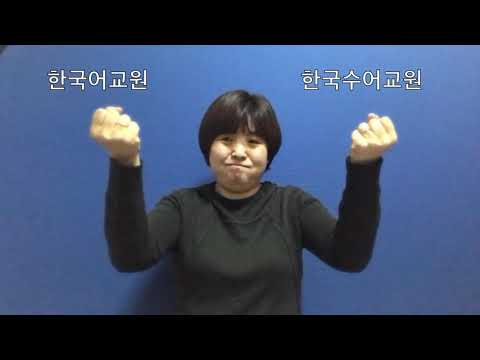

In [4]:
KSL_ID = 'ymevDU7PSWs'
YouTubeVideo(KSL_ID)

After downloading the video, process it through openpose.
By default CMU openpose doesn't not annotate face and hand poses. To include them, add '--hand --face' as shown below:

`./build/examples/openpose/openpose.bin --face --hand --video ../video.mp4 --write_json ./output/ --display 0  --write_video ../openpose.avi`

For details on how to use openpose, refer to the [openpose github](https://github.com/CMU-Perceptual-Computing-Lab/openpose#quick-start-overview)

The output is in *.avi format so convert it into *.mp4 for easy processing. The conversion can be done through ffmpeg.

Two outputs are specified.
- --write_json: write the auto-annotation results to a json file. For each frame of the video, one json file will be generated.
- --write_video: writes a video that includes the pose annotations

In [5]:
def download_youtube(youtube_id, duration=10):
  !rm -rf youtube.mp4
  # download the youtube with the given ID
  !youtube-dl -f 'bestvideo[ext=mp4]' --output "youtube.%(ext)s" https://www.youtube.com/watch?v=$youtube_id
  # cut the first 5 seconds
  !ffmpeg -y -loglevel info -i youtube.mp4 -t $duration video.mp4
  # detect poses on the these 10 seconds
  !rm openpose.avi
  !cd openpose && ./build/examples/openpose/openpose.bin --face --hand --video ../video.mp4 --write_json ./output/ --display 0  --write_video ../openpose.avi
  # convert the result into MP4
  !ffmpeg -y -loglevel info -i openpose.avi output.mp4

download_youtube(KSL_ID, duration=10)

[youtube] ymevDU7PSWs: Downloading webpage
[youtube] ymevDU7PSWs: Downloading MPD manifest
[download] Destination: youtube.mp4
[download] 100% of 186.63MiB in 00:34
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-

Download the above youtube video, cut the first 10 seconds and do the pose detection on that 10 seconds:

Finally, visualize the result:

## Visualize the result

### video
Openpose outputs a video file that contains superimposed keypoint annotations. Let's first see how we can visualize it.

In [6]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video('output.mp4', width=960, height=720)

### json
Corresponding each frame is a json file that contains elements for:

- pose_keypoints_2d
- face_keypoints_2d
- hand_keypoints_2d

Each key point is defined as (x, y, confidence).
Below is an example file and a simple visualization of the three key points.

In [ ]:
{
    "version": 1.3,
    "people": [
        {
            "person_id": [
                -1
            ],
            "pose_keypoints_2d": [
                951.139,
                480.116,
                0.851527,
                954.201,
                689.193,
                0.685063,
                718.672,
                674.585,
                0.543361,
                521.41,
                1018.89,
                0.439235,
                809.908,
                912.952,
                0.507798,
                1192.57,
                689.212,
                0.534579,
                1324.98,
                1051.23,
                0.486293,
                1092.5,
                921.709,
                0.488758,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                895.27,
                430.103,
                0.80459,
                1001.23,
                430.119,
                0.859737,
                818.754,
                436.202,
                0.685974,
                1092.46,
                421.395,
                0.646877,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0
            ],
            "face_keypoints_2d": [
                826.538,
                420.695,
                0.664815,
                826.538,
                453.268,
                0.726826,
                827.701,
                483.515,
                0.763742,
                835.844,
                512.598,
                0.830629,
                853.294,
                540.518,
                0.783202,
                873.071,
                560.295,
                0.84458,
                891.684,
                581.234,
                0.759569,
                917.277,
                597.521,
                0.794505,
                947.524,
                606.828,
                0.830592,
                983.587,
                605.664,
                0.764887,
                1011.51,
                587.051,
                0.793389,
                1038.26,
                563.785,
                0.697113,
                1059.2,
                540.518,
                0.702283,
                1076.65,
                506.781,
                0.705468,
                1082.47,
                475.371,
                0.649377,
                1083.63,
                439.308,
                0.589474,
                1080.14,
                406.735,
                0.471469,
                846.314,
                382.305,
                0.517151,
                862.601,
                372.999,
                0.556174,
                881.214,
                366.019,
                0.551965,
                904.481,
                363.692,
                0.532177,
                926.584,
                364.855,
                0.536845,
                981.261,
                384.632,
                0.566445,
                1001.04,
                383.468,
                0.68124,
                1020.81,
                383.468,
                0.691542,
                1040.59,
                383.468,
                0.578028,
                1051.06,
                391.612,
                0.377421,
                946.361,
                411.388,
                0.838859,
                947.524,
                438.145,
                0.907532,
                948.687,
                462.575,
                0.845282,
                951.014,
                487.005,
                0.812557,
                926.584,
                503.291,
                0.921128,
                937.054,
                505.618,
                0.985088,
                952.177,
                511.435,
                0.872653,
                966.137,
                505.618,
                0.908455,
                982.424,
                503.291,
                0.832754,
                871.908,
                428.838,
                0.889709,
                882.378,
                428.838,
                0.918648,
                898.664,
                427.675,
                0.850918,
                910.297,
                428.838,
                0.827413,
                898.664,
                430.002,
                0.970619,
                883.541,
                431.165,
                0.938057,
                987.077,
                425.348,
                0.64753,
                1002.2,
                424.185,
                0.718511,
                1013.83,
                427.675,
                0.619283,
                1021.98,
                428.838,
                0.542805,
                1012.67,
                430.002,
                0.687195,
                1002.2,
                428.838,
                0.782622,
                900.991,
                532.375,
                0.744149,
                920.767,
                531.211,
                0.85551,
                938.217,
                525.395,
                0.861202,
                952.177,
                530.048,
                0.880921,
                964.974,
                525.395,
                0.89781,
                980.097,
                531.211,
                0.845518,
                995.221,
                535.865,
                0.686897,
                977.771,
                549.825,
                0.834523,
                964.974,
                552.151,
                0.854871,
                951.014,
                553.315,
                0.800243,
                938.217,
                550.988,
                0.878431,
                920.767,
                547.498,
                0.793947,
                910.297,
                533.538,
                0.766187,
                938.217,
                537.028,
                0.86602,
                951.014,
                539.355,
                0.841195,
                964.974,
                537.028,
                0.87418,
                988.241,
                537.028,
                0.737325,
                964.974,
                537.028,
                0.863184,
                951.014,
                539.355,
                0.846832,
                938.217,
                537.028,
                0.838925,
                890.521,
                430.002,
                0.92398,
                1008.02,
                427.675,
                0.643618
            ],
            "hand_left_keypoints_2d": [
                905.484,
                941.187,
                0.082329,
                953.564,
                944.015,
                0.0570803,
                911.141,
                837.957,
                0.0877891,
                885.687,
                815.331,
                0.247884,
                874.374,
                816.745,
                0.185516,
                983.26,
                812.503,
                0.179653,
                853.162,
                837.957,
                0.146915,
                840.435,
                829.472,
                0.206812,
                817.809,
                806.847,
                0.289591,
                1035.58,
                813.917,
                0.285373,
                1000.23,
                874.724,
                0.173424,
                802.254,
                861.997,
                0.128384,
                830.536,
                883.209,
                0.117769,
                1063.86,
                825.23,
                0.282017,
                1044.07,
                894.522,
                0.304554,
                786.699,
                876.138,
                0.164715,
                776.8,
                852.098,
                0.169657,
                834.779,
                962.399,
                0.434161,
                796.598,
                963.813,
                0.406121,
                799.426,
                963.813,
                0.431795,
                1068.11,
                918.561,
                0.345921
            ],
            "hand_right_keypoints_2d": [
                942.961,
                912.928,
                0.0497181,
                902.201,
                952.232,
                0.0204189,
                967.708,
                813.94,
                0.0271103,
                854.163,
                848.877,
                0.0483868,
                892.011,
                822.674,
                0.0412984,
                875.999,
                837.231,
                0.0419703,
                827.96,
                885.269,
                0.0688001,
                886.188,
                841.598,
                0.102075,
                886.188,
                815.396,
                0.122211,
                809.036,
                939.13,
                0.0217673,
                897.834,
                891.092,
                0.0473194,
                905.113,
                894.004,
                0.0527376,
                897.834,
                816.851,
                0.0435186,
                1024.48,
                873.624,
                0.0305732,
                1039.04,
                895.459,
                0.0589162,
                996.822,
                898.371,
                0.049467,
                795.935,
                975.523,
                0.0394648,
                1027.39,
                870.712,
                0.0429818,
                1034.67,
                894.004,
                0.0929336,
                1037.58,
                896.915,
                0.0511328,
                1004.1,
                905.649,
                0.0304012
            ],
            "pose_keypoints_3d": [],
            "face_keypoints_3d": [],
            "hand_left_keypoints_3d": [],
            "hand_right_keypoints_3d": []
        }
    ]
}

### images
Under the hood, openpose splits the video into individual frames and auto-annotate each image. To see the detailed output, we can use ffmpeg to see how the video is plit into different frame images.

The command to do that is:

`-vf fps=30`

To make the output filenames easy to trace, let's format the numbered output file names by padding them with five zeroes.
`./images/out%05.png`

In [7]:
!rm openpose/images/out*.png
!mkdir openpose/images/
!cd openpose && ffmpeg -i ../video.mp4 -vf fps=30 ./images/out%05d.png

rm: cannot remove 'openpose/images/out*.png': No such file or directory
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable

Then load and plot the images.

In [69]:
import cv2
import glob
import numpy as np
import os

from matplotlib import pyplot as plt

# IMAGE_SIZE = 224

def load_images(path):
    path = os.path.join(path,'*')
    files = glob.glob(path)
    # We sort the images in alphabetical order to match them
    #  to the annotation files
    files.sort()

    X_raw = []
    for file in files:
        image = cv2.imread(file)
        # image = cv2.resize(image, (IMAGE_SIZE,IMAGE_SIZE))
        X_raw.append(np.array(image))

    return X_raw
        
def plot_images(X, Y, limit=20):
  fig = plt.figure(figsize=(20,40))

  # The number of images for plotting is limited to 50
  end_id = len(X) if len(X) < limit else limit

  for i in range(0, end_id):
    axis = fig.add_subplot(10, 5, i+1)
    plt.axis('off')
    image = X[i]

    plt.imshow(image)

In [9]:
import json

def from_json(path):
    """
    save json data to path
    """
    file = open(path, 'r', encoding='utf-8')
    return json.load(file)

In [85]:
import numpy as np

def extract_pose_ann(ann_json):
  def extract_ann(ann_json):
    X = []
    Y = []
    C = []
    id = 0
    while id < len(ann_json):
      if ann_json[id] != 0:
        X.append(ann_json[id])
        Y.append(ann_json[id+1])
        C.append(ann_json[id+2])
        id += 3
      else:
        id += 1
  
    return np.array([X, Y, C])

  kp_pose = extract_ann(ann_json['people'][0]['pose_keypoints_2d'])
  kp_face = extract_ann(ann_json['people'][0]['face_keypoints_2d'])
  kp_hand_left = extract_ann(ann_json['people'][0]['hand_left_keypoints_2d'])
  kp_hand_right = extract_ann(ann_json['people'][0]['hand_right_keypoints_2d'])

  pose = {}
  pose['pose'] = kp_pose
  pose['face'] = kp_face
  pose['hand_left'] = kp_hand_left
  pose['hand_right'] = kp_hand_right

  return pose

# pose = extract_pose_ann(ann0)

In [86]:
import glob
import os

path = "./openpose/output/"

def extract_pose_annotations(path):
  path = os.path.join(path,'*')
  files = glob.glob(path)
  files.sort()

  Y_raw = []
  for file in files:
    ann_json = from_json(files[0])
    ann = extract_pose_ann(ann_json)
    Y_raw.append(ann)

  return Y_raw

## Load the images and key point files
Having defined the methods, let's load the images and the key point annotation files.

In [70]:
X_raw = load_images("openpose/images/")
len(X_raw)

300

In [ ]:
Y_raw = extract_pose_annotations(path)
len(Y_raw)

## Visualize the key points on images

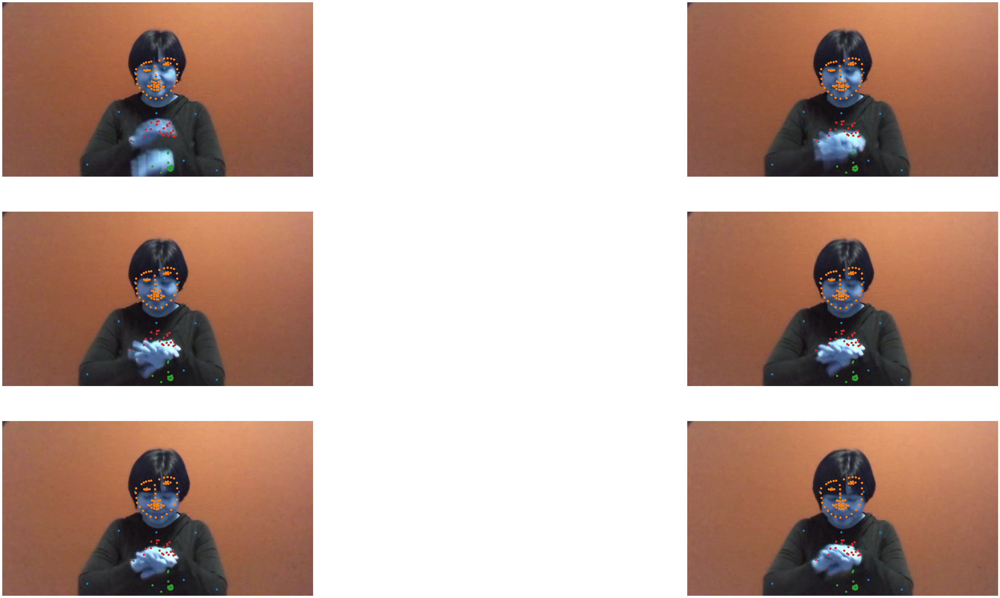

In [109]:
import matplotlib.pyplot as plt

def plot_pose(X, Y, limit=10):
  # fig, ax = plt.subplots()
  fig = plt.figure(figsize=(70, 70))

  # The number of images for plotting is limited to 50
  end_id = len(Y) if len(Y) < limit else limit

  for id in range(end_id):
    x = X[id]
    y = Y[id]

    ax = fig.add_subplot(6, 2, id+1)
    plt.axis('off')

    ax.imshow(x)

    ax.scatter(y['pose'][0], y['pose'][1])
    ax.scatter(y['face'][0], y['face'][1])
    ax.scatter(y['hand_left'][0], y['hand_left'][1], label='left')
    ax.scatter(y['hand_right'][0], y['hand_right'][1], label='right')
    # ax.legend()

  # ax.invert_yaxis()

plot_pose(X_raw, Y_raw, limit=6)

# Appendix
tf_pose

In [ ]:
from tf_pose import common
from tf_pose.estimator import TfPoseEstimator
from tf_pose.networks import get_graph_path, model_wh

model='mobilenet_thin'
resize='432x368'
w, h = model_wh(resize)
if w == 0 or h == 0:
    e = TfPoseEstimator(get_graph_path(model), target_size=(432, 368))
else:
    e = TfPoseEstimator(get_graph_path(model), target_size=(w, h))

In [ ]:
!pip install tf_pose

In [2]:
import tf_pose

from tf_pose import common
from tf_pose.estimator import TfPoseEstimator
from tf_pose.networks import get_graph_path, model_wh

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.


